In [2]:
import os
import numpy as np 
import pandas as pd
import tifffile as tif
import itertools, collections
import IPython
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_addons as tfa
import librosa

# Will perform two methods of audio data augmentation. 
### 1. Pitch shift and noise addition (directly modifying the audio files)
######                    Will require re-calculation of mel-spectrogram
### 2. Modifying the Mel-Spectrogram as seen in the below reference
###### https://arxiv.org/pdf/1904.08779.pdf

# 1. Pitch shift and noise addition

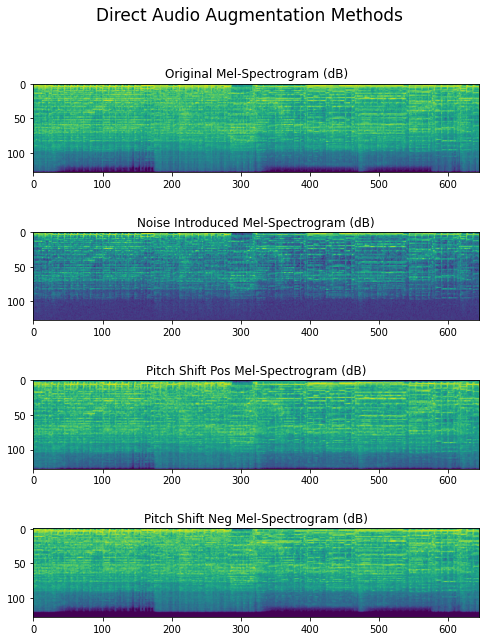

In [70]:
track_path = "Example_Audio_Files/Example_Rock.mp3"
noise_path = "Example_Audio_Files/Example_Rock_noise_test.mp3"
shift_up_path = "Example_Audio_Files/Example_Rock_shift_up_test.mp3"
shift_down_path = "Example_Audio_Files/Example_Rock_shift_down_test.mp3"
shift_val = 3

y, sr = librosa.load(track_path)

noise = np.random.uniform(low=0.01, high=0.15, size=(len(y),)).astype(np.float32)
noisey_y = y+noise
librosa.output.write_wav(noise_path,noisey_y,sr)

pitch_shifted_pos_y = librosa.effects.pitch_shift(y, sr, shift_val)
librosa.output.write_wav(shift_up_path,pitch_shifted_pos_y,sr)

pitch_shifted_neg_y = librosa.effects.pitch_shift(y, sr, -shift_val)
librosa.output.write_wav(shift_down_path,pitch_shifted_neg_y,sr)

#Visualize
original_mel_spect = get_db_mel_spect(y,sr)
noisey_mel_spect = get_db_mel_spect(noisey_y,sr)
shifted_up_mel_spect = get_db_mel_spect(pitch_shifted_pos_y,sr)
shifted_down_mel_spect = get_db_mel_spect(pitch_shifted_neg_y,sr)

f,a = plt.subplots(4,1)#,sharex=True,sharey=True)
a[0].imshow(original_mel_spect)
a[0].set_title("Original Mel-Spectrogram (dB)")

a[1].imshow(noisey_mel_spect)
a[1].set_title("Noise Introduced Mel-Spectrogram (dB)")

a[2].imshow(shifted_up_mel_spect)
a[2].set_title("Pitch Shift Pos Mel-Spectrogram (dB)")


a[3].imshow(shifted_down_mel_spect)
a[3].set_title("Pitch Shift Neg Mel-Spectrogram (dB)")

f.subplots_adjust(wspace=0, hspace=0.5)
plt.suptitle("Direct Audio Augmentation Methods",fontsize=17)
f.set_size_inches(8,10)

### Modified Audio Samples:

##### Original Audio

In [71]:
IPython.display.Audio(track_path)

##### Noise Added Audio

In [72]:
IPython.display.Audio(noise_path)

##### Pitch Shifted Up

In [73]:
IPython.display.Audio(shift_up_path)

##### Pitch Shifted Down

In [74]:
IPython.display.Audio(shift_down_path)

# 2. Modifying the Mel-Spectrogram
#### Paper includes: time warping, frequency masking, and time masking


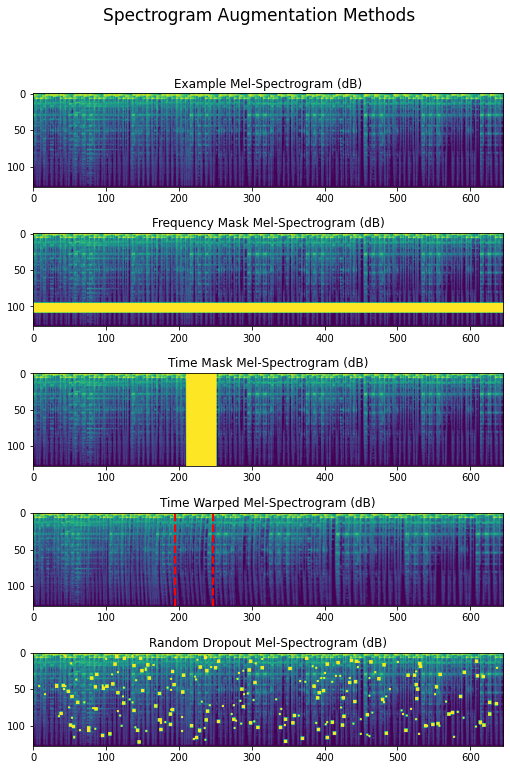

In [21]:
# from librosa import display

mel_spect_path = "Example_Audio_Files/Example_Electronic_Mel_Spectrogram.tiff"
mel_spect_db_path = "Example_Audio_Files/Example_Electronic_Mel_Spectrogram_db.tiff"

mel_spect = tif.imread(mel_spect_path)
mel_spect_db = tif.imread(mel_spect_db_path)
f,a = plt.subplots(5,1)#,sharex=True,sharey=True)
a[0].imshow(mel_spect_db)
a[0].set_title("Example Mel-Spectrogram (dB)")

mel_spect_freq_mask = freq_mask(mel_spect_db)
a[1].imshow(mel_spect_freq_mask)
a[1].set_title("Frequency Mask Mel-Spectrogram (dB)")

mel_spect_time_mask = time_mask(mel_spect_db)
a[2].imshow(mel_spect_time_mask)
a[2].set_title("Time Mask Mel-Spectrogram (dB)")

mel_spect_warp, coords = warp_mel_spect(mel_spect_db)
mel_spect_warp = np.array(mel_spect_warp)
a[3].imshow(mel_spect_warp)
a[3].set_title("Time Warped Mel-Spectrogram (dB)")
a[3].axvline(coords[0][1],c='red',lw=2,linestyle='--')
a[3].axvline(coords[1][1],c='red',lw=2,linestyle='--')

mel_spect_dropout = random_dropout(mel_spect_db,0.0075)
a[4].imshow(mel_spect_dropout)
a[4].set_title("Random Dropout Mel-Spectrogram (dB)")

f.subplots_adjust(wspace=0, hspace=0.5)
plt.suptitle("Spectrogram Augmentation Methods",fontsize=17)
f.set_size_inches(10,12)

## Reconstruct and play the time warped augmented mel-spectrogram
##### Will be somewhat lossy because conversion from Mel to STFT spectrogram is not entirely lossless 
##### Will introduce a "phaser" type sound artifact

In [55]:
y,sr = librosa.load("Example_Audio_Files/Example_Electronic.mp3")
mel_spect_power = librosa.db_to_power(mel_spect_warp)
audio_signal = librosa.feature.inverse.mel_to_audio(mel_spect_power, sr = sr,n_fft = 2048, hop_length=1024,
                                                   window="hann",power=2,pad_mode='reflect',win_length=None,
                                                   center=True)
audio_signal_scaled = audio_signal/max(audio_signal)
librosa.output.write_wav("Example_Audio_Files/Augmented_Reconstruction.mp3",audio_signal_scaled,sr)



### Original (top) Time-Warp Augmented (bottom)

In [53]:
IPython.display.Audio("Example_Audio_Files/Example_Electronic.mp3")

In [56]:
IPython.display.Audio("Example_Audio_Files/Augmented_Reconstruction.mp3")

In [75]:
# Augmentation Functions
def freq_mask(mel_spect,F=27):
    """
    input: mel_spect: 2d array of mel spectrogram
    F: max possible number of frequency channels to block
    Default value chosen from table 1 of:
    https://arxiv.org/pdf/1904.08779.pdf
    """
    f = int(np.random.uniform(5,F))
    mel_spect = mel_spect.copy()
    ht,wd = mel_spect.shape
    start_freq = np.random.choice(np.arange(0,ht-F))
    ending_freq = start_freq+f
    mel_spect[start_freq:ending_freq,:] = 0 
    return mel_spect
    
def time_mask(mel_spect,T=100):
    """
    input: mel_spect: 2d array of mel spectrogram
    T: max possible number of time steps to block
    Default value chosen from table 1 of:
    https://arxiv.org/pdf/1904.08779.pdf
    """
    t = int(np.random.uniform(10,T))
    mel_spect = mel_spect.copy()
    ht,wd = mel_spect.shape
    start_time = np.random.choice(np.arange(0,wd-T))
    ending_time = start_time+t
    mel_spect[:,start_time:ending_time] = 0 
    return mel_spect

def warp_mel_spect(mel_spect,W=80):
    """
    input: mel_spect: 2d array of mel spectrogram
    W: max possible warping distance window 
    Default value and method description seen in:
    https://arxiv.org/pdf/1904.08779.pdf

    """
    mel_spect = mel_spect.copy()
    hght,wdth = mel_spect.shape
    
    warp_pt_x = np.random.choice(np.arange(W,wdth-W))
    warp_pt_y = hght//2
    warp_start = [warp_pt_y,warp_pt_x]
    warp_dist = int(np.random.uniform(25,W))*np.random.choice([1,-1])
    warp_destination = [warp_pt_y, warp_pt_x+warp_dist]

    anchor_points = [warp_start, 
                     [0,0],
                     [hght,0],
                     [0,wdth],
                     [hght,wdth],
                     [warp_pt_y,0],
                     [warp_pt_y,wdth]]

    destination_points = [warp_destination,
                         [0,0],
                         [hght,0],
                         [0,wdth],
                         [hght,wdth],
                         [warp_pt_y,0],
                         [warp_pt_y,wdth]]

    src = np.array(anchor_points).reshape(1,7,2).astype(np.float32)
    dst = np.array(destination_points).reshape(1,7,2).astype(np.float32)

    warped_mel, _ = tfa.image.sparse_image_warp(mel_spect,src,dst)
    return warped_mel, [warp_start,warp_destination]

def random_dropout(mel_spect,pct_of_image_to_mask=0.005):
    """
    input: mel_spect: 2d array of mel spectrogram
    pct_of_image_to_mask: percent of image to randomly mask
    
    """
    mel_spect = mel_spect.copy()
    hght,wdth = mel_spect.shape
    num_pix = hght*wdth
    num_pix_to_mask = int(pct_of_image_to_mask*num_pix)

    y_index = np.random.choice(np.arange(5,hght-5),num_pix_to_mask)
    x_index = np.random.choice(np.arange(5,wdth-5),num_pix_to_mask)

    num_covered_pix = 0
    for y,x in zip(y_index,x_index):
        mel_spect[y,x] = 0
        dialate_radius = np.random.choice(np.arange(1,3))
        for r in np.arange(0,dialate_radius):
            rad = r + 1
            movement_vectors = list(itertools.product([n for n in range(1,rad+1)] + [-n for n in range(0,rad+1)], repeat =2))
            for coord in movement_vectors:
                drop_y = y+coord[1]
                drop_x = x+coord[0]
                mel_spect[drop_y,drop_x] = 0
        num_covered_pix+=dialate_radius**2
        if num_covered_pix > num_pix_to_mask:
            break
    return mel_spect

#Audio Augmenting Functions
def get_db_mel_spect(y,sr):
    mel = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048,
                                         hop_length=1024,
                                         win_length=None,
                                         window='hann',
                                         center=True, pad_mode='reflect',
                                         power=2.0) #,
    mel_db = librosa.power_to_db(mel, ref=np.max)
    return mel_db